<a href="https://colab.research.google.com/github/cjatian/ATIAN_CPE018-CPE31S2/blob/main/Activity_10_Object_Detection_and_Recognition_Techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Technological Institute of the Philippines | Quezon City - Computer Engineering
--- | ---
Course Code: | CPE 018
Code Title: | Emerging Technologies in CpE 1 - Fundamentals of Computer Vision
1st Semester | AY 2025-2026
<hr> | <hr>
<u>**ACTIVITY NO. 11** | **Object Detection and Recognition Techniques**
**Name** | Atian, Catherine Joy D.
**Section** | CPE31S2
**Date Performed**: | March 31, 2026
**Date Submitted**: | April 18, 2026
**Instructor**: | Engr. Maria Rizette Sayo

<hr>

## 1. Objectives

This activity aims to introduce students to object detection and recongition through the use of histogram of gradients (HoG), image pyramids and sliding windows in OpenCV.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Demonstrate object detection and recognition using histogram of gradients, image pyramids and sliding windows in OpenCV.
* Evaluate the performance of the object detection and recognition techniques in OpenCV.

## 3. Procedures and Outputs

When it comes to recognizing and detecting objects, there are a number of techniques used in computer vision, which we'll be examining:
* Histogram of Oriented Gradients
* Image pyramids
* Sliding windows

Unlike feature detection algorithms, these are not mutually exclusive techniques, rather, they are complimentary. You can perform a Histogram of Oriented Gradients (HOG) while applying the sliding windows technique. So, let's take a look at HOG first and understand what it is.

### History of Gradients (HoG) Descriptors

HOG is a feature descriptor, so it belongs to the same family of algorithms, such as SIFT, SURF, and ORB.

It is used in image and video processing to detect objects. Its internal mechanism is really clever; an image is divided into portions and a gradient for each portion is calculated. We've observed a similar approach when we talked about face recognition through LBPH.

HOG, however, calculates histograms that are not based on color values, rather, they are based on gradients. As HOG is a feature descriptor, it is capable of delivering the type of information that is vital for feature matching and object detection/recognition.

Before diving into the technical details of how HOG works, let's first take a look at how HOG sees the world; here is an image of a truck:

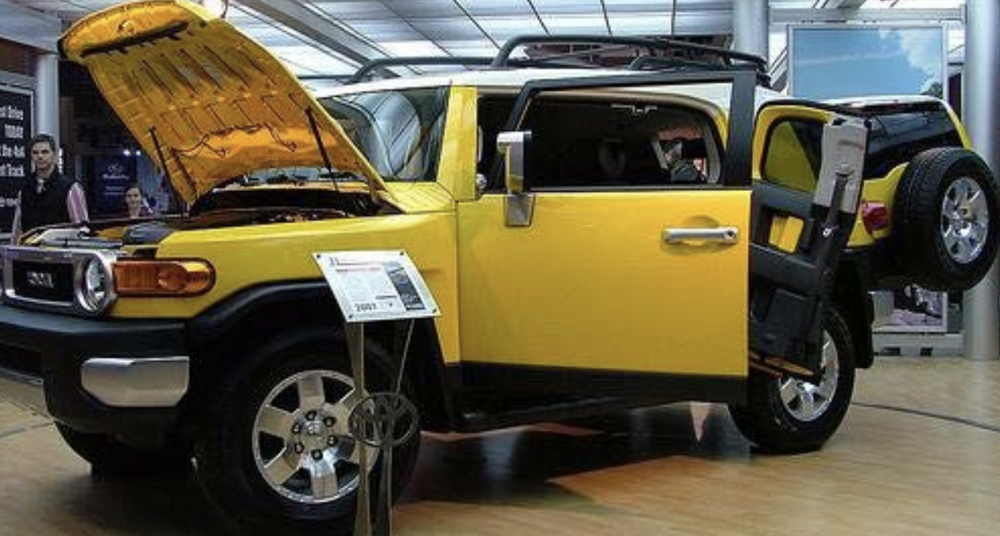

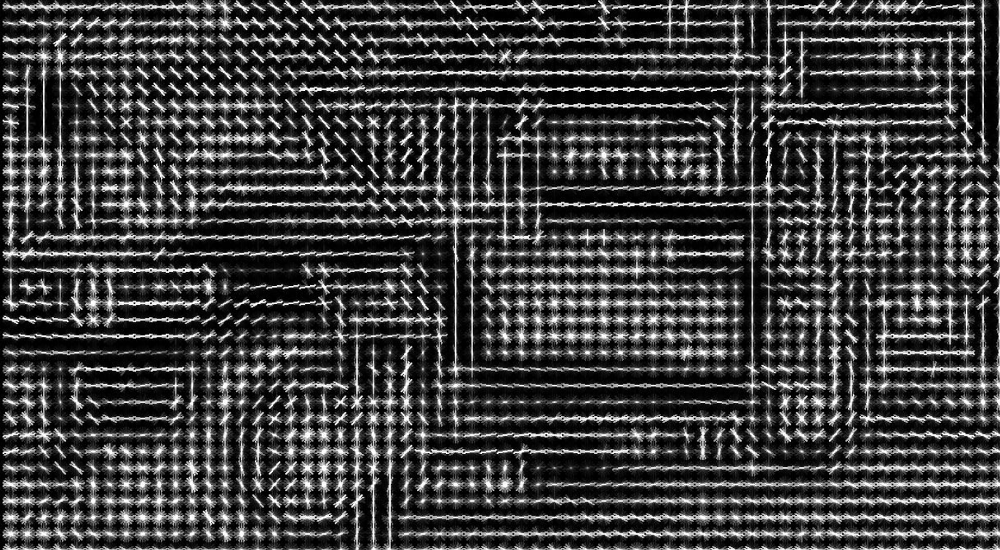

**Question: Here you are shown the original image and how HOG sees the image. Analyze the output and provide a description. Are you able to see that it is the same image?**

- The HOG does not show a visual image like the original. But instead, it creates a feature vector cross stitch like that represent
orientations in different parts of the image. While I cannot visually see
the same image, the HOG features capture important structural
information about the shapes and edges in the original image. This allows
algorithms to recognize objects based on shape rather than color.

The extrapolation of histograms into descriptors is quite a complex process.
- First, local histograms for each cell are calculated. The cells are grouped into larger regions called blocks. These blocks can be made of any number of cells, but Dalal and Triggs found that 2x2 cell blocks yielded the best results when performing people detection.
- A block-wide vector is created so that it can be normalized, accounting for variations in illumination and shadowing (a single cell is too small a region to detect such variations). This improves the accuracy of detection as it reduces the illumination and shadowing difference between the sample and the block being examined.
- Simply comparing cells in two images would not work unless the images are identical (both in terms of size and data).

There are two main problems to resolve:
1. Location
2. Scale

**The Scale Issue**

Imagine, for example, if your sample was a detail (say, a bike) extrapolated from a larger image, and you're trying to compare the two pictures. You would not obtain the same gradient signatures and the detection would fail (even though the bike is in both pictures).

**The Location Issue**

Once we've resolved the scale problem, we have another obstacle in our path: a potentially detectable object can be anywhere in the image, so we need to scan the entire image in portions to make sure we can identify areas of interest, and within these areas, try to detect objects. Even if a sample image and object in the image are of identical size, there needs to be a way to instruct OpenCV to locate this object. So, the rest of the image is discarded and a comparison is made on potentially matching regions.

*To obviate these problems, we need to familiarize ourselves with the concepts of image pyramid and sliding windows.*

### Image Pyramids

Many of the algorithms used in computer vision utilize a concept called pyramid. An image pyramid is a multiscale representation of an image. This diagram should
help you understand this concept:

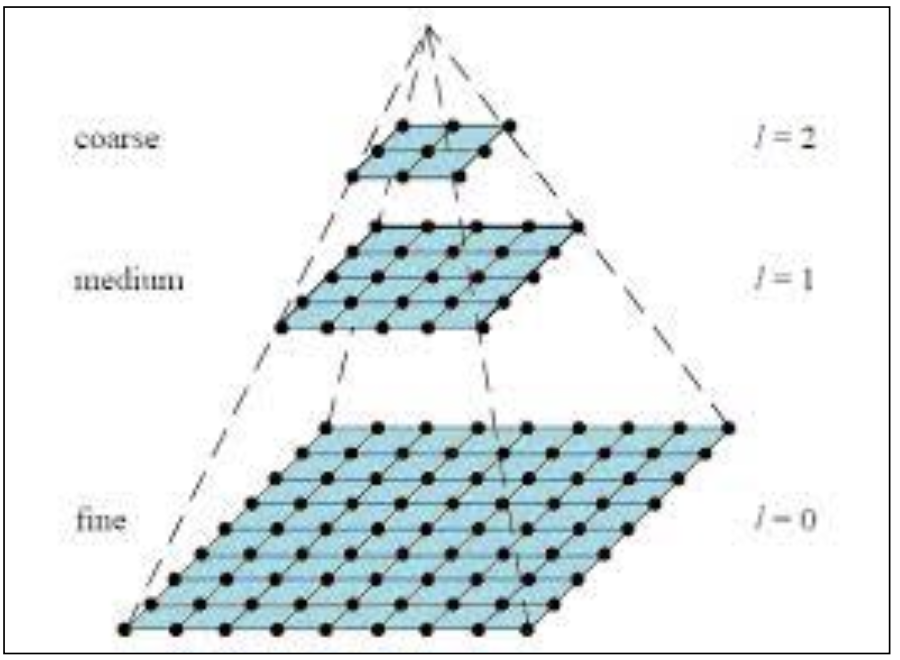

A multiscale representation of an image, or an image pyramid, helps you resolve the problem of detecting objects at different scales. The importance of this concept is easily explained through real-life hard facts, such as it is extremely unlikely that an object will appear in an image at the exact scale it appeared in our sample image.
Moreover, you will learn that object classifiers (utilities that allow you to detect objects in OpenCV) need training, and this training is provided through image databases made up of positive matches and negative matches. Among the positives, it is again unlikely that the object we want to identify will appear in the same scale throughout the training dataset.

**Follow the steps and create a function that can make an image Pyramid**:

1. Take an image.
2. Resize (smaller) the image using an arbitrary scale parameter.
3. Smoothen the image (using Gaussian blurring).
4. If the image is larger than an arbitrary minimum size, repeat the process from step 1.

Demonstrate by creating a function and showing the different scales of the image.

Mounted at /content/drive
Original Image:


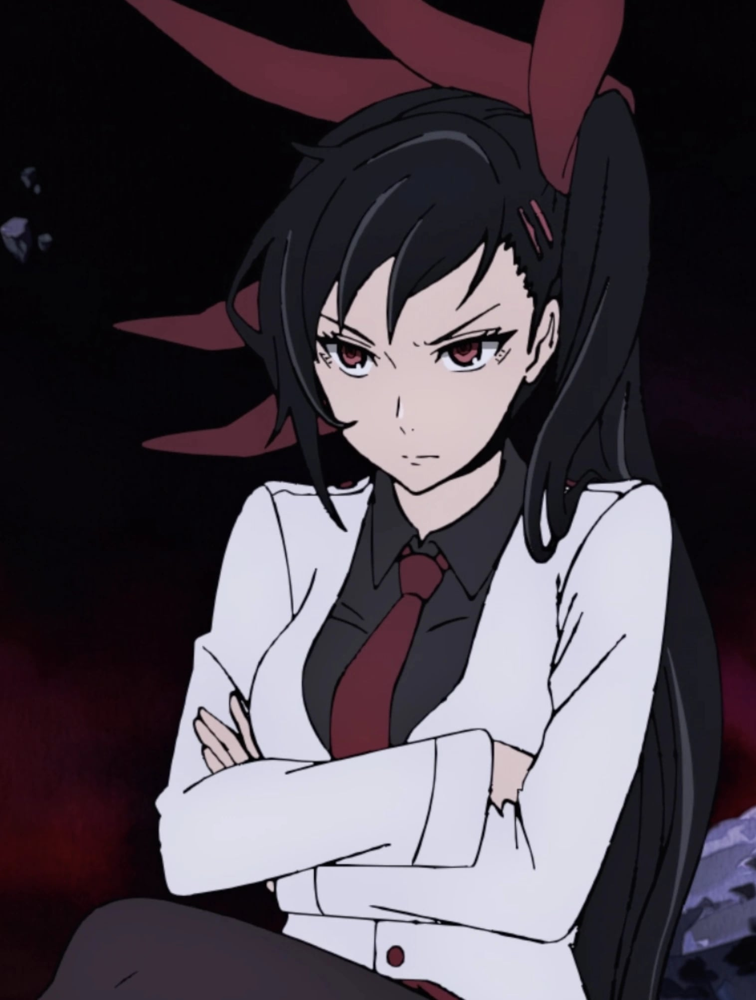


Image Pyramid created with 10 levels:
Level 1: (2004, 1516, 3)


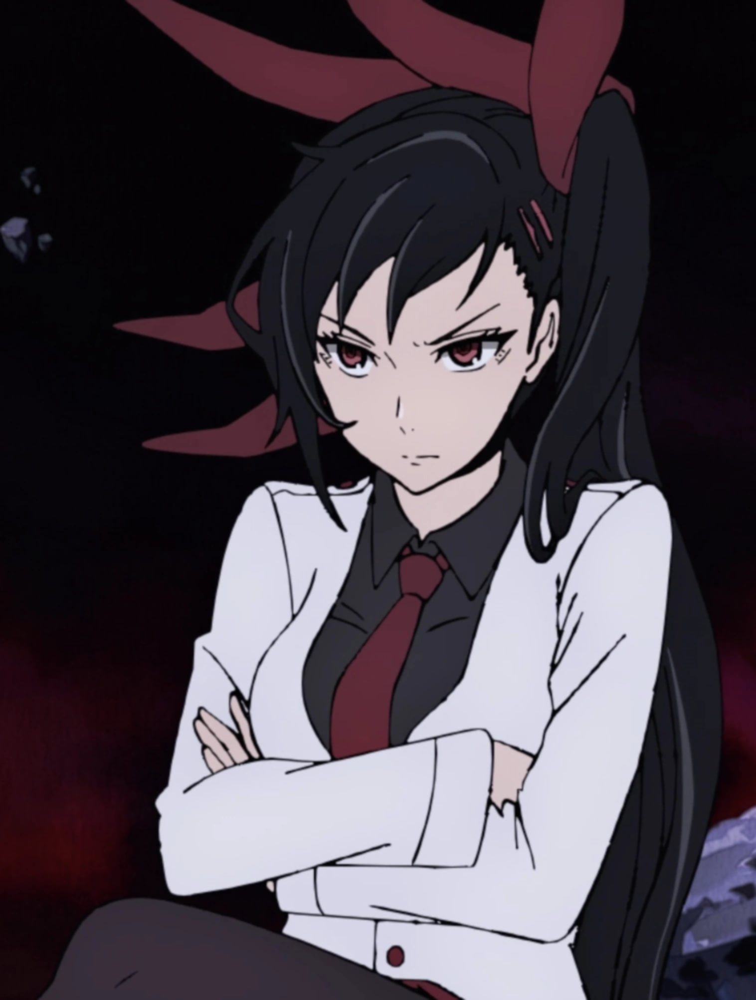

Level 2: (1336, 1010, 3)


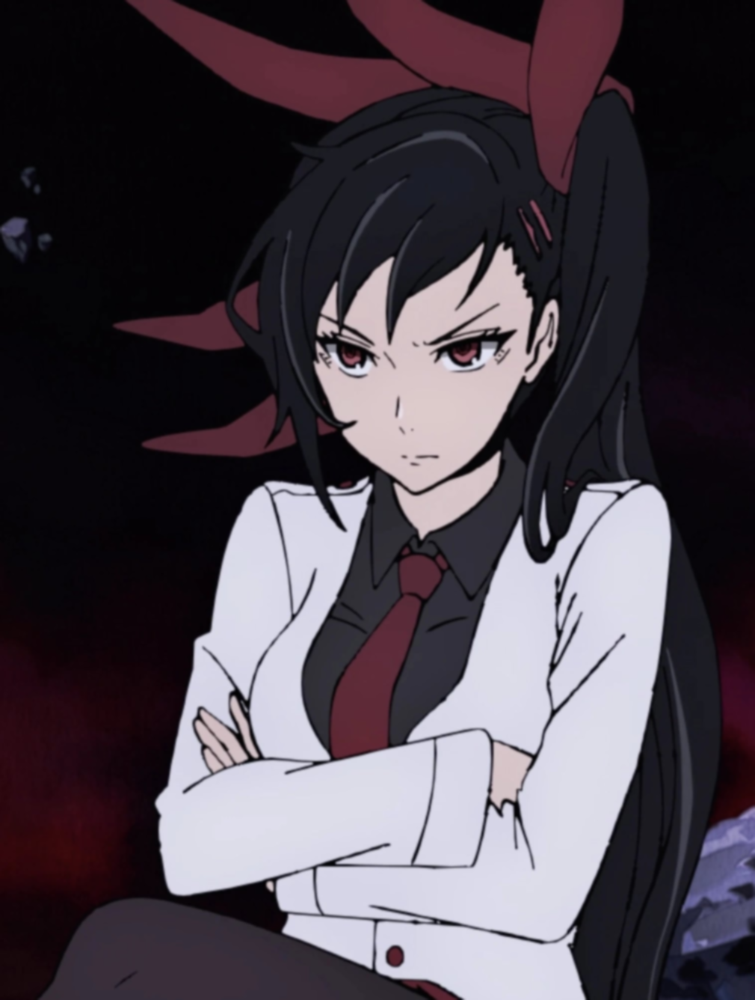

Level 3: (890, 673, 3)


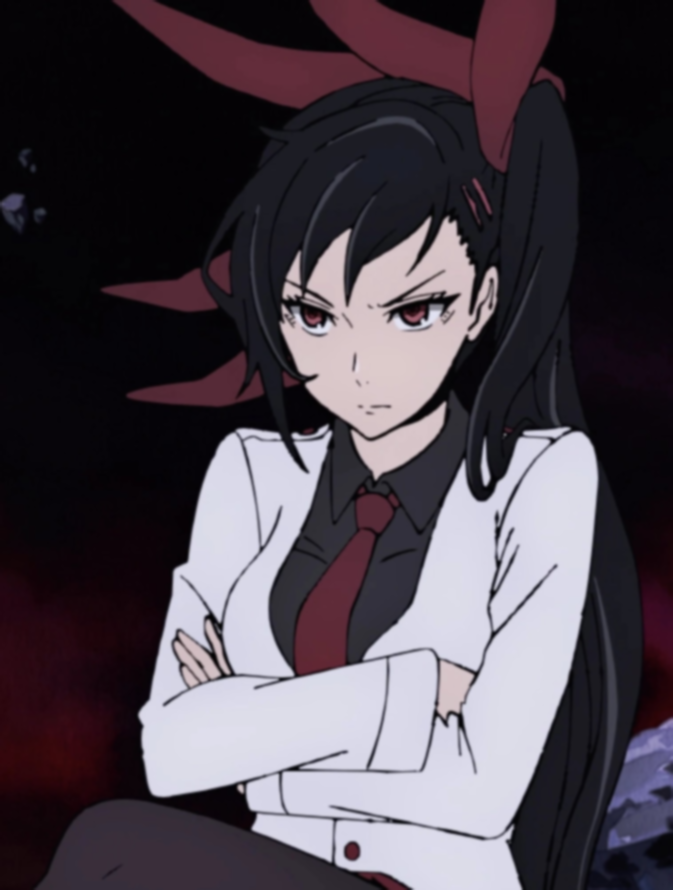

Level 4: (593, 448, 3)


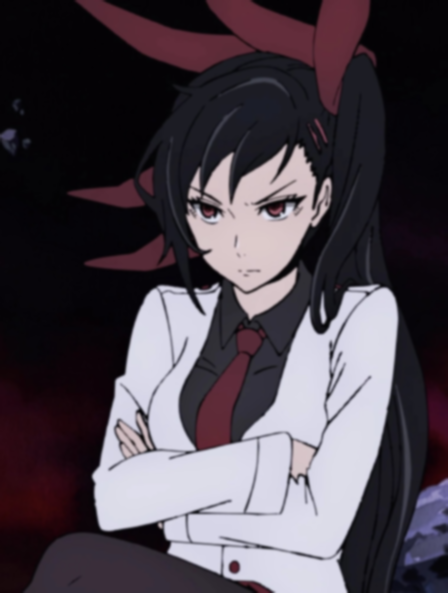

Level 5: (395, 298, 3)


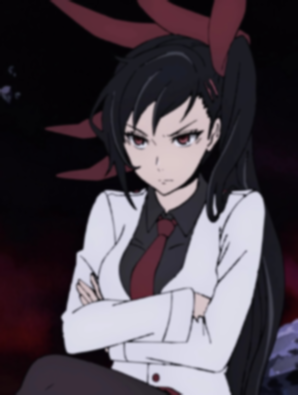

Level 6: (263, 198, 3)


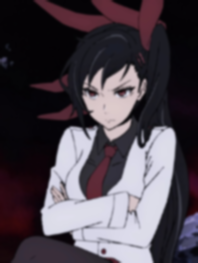

Level 7: (175, 132, 3)


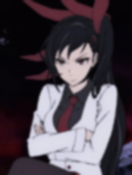

Level 8: (116, 88, 3)


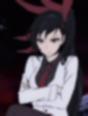

Level 9: (77, 58, 3)


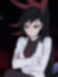

Level 10: (51, 38, 3)


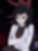

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive
import matplotlib.pyplot as plt
import os

drive.mount('/content/drive')

drive_path = '/content/drive/MyDrive/CPE018-CPE31S2/'

def create_image_pyramid(image, scale=1.5, min_size=(30, 30)):
    pyramid = []
    current_image = image.copy()

    while current_image.shape[0] > min_size[0] and current_image.shape[1] > min_size[1]:
        blurred = cv2.GaussianBlur(current_image, (5, 5), 0)
        pyramid.append(blurred)

        new_width = int(current_image.shape[1] / scale)
        new_height = int(current_image.shape[0] / scale)
        current_image = cv2.resize(current_image, (new_width, new_height))

    return pyramid

if os.path.exists(os.path.join(drive_path, 'sample.jpg')):
    pyramid_img = cv2.imread(os.path.join(drive_path, 'sample.jpg'))
else:
    pyramid_img = np.zeros((400, 400, 3), dtype=np.uint8)
    cv2.rectangle(pyramid_img, (50, 50), (350, 350), (0, 255, 0), 2)
    cv2.circle(pyramid_img, (200, 200), 100, (0, 0, 255), 2)
    cv2.putText(pyramid_img, "TEST", (150, 220), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

print("Original Image:")
cv2_imshow(pyramid_img)

pyramid_levels = create_image_pyramid(pyramid_img, scale=1.5, min_size=(30, 30))

print(f"\nImage Pyramid created with {len(pyramid_levels)} levels:")
for i, level in enumerate(pyramid_levels):
    print(f"Level {i+1}: {level.shape}")
    cv2_imshow(level)

**Question: How does the performance of your functions in obtaining the image pyramid perform in iterations of the image that decrease until the scale factor is achieved?**

- The image pyramid function repeatedly shrinks the image by the scale factor (1.5)
and applies Gaussian blur at each level. The function stops when the image reaches
the minimum size of 30x30 pixels. The number of iterations depends on the original
image size and the scale factor. A smaller scale factor (closer to 1.0) would
produce more levels with finer granularity between scales but takes longer to
process. A larger scale factor produces fewer levels but may miss objects at
scales between levels. This multiscale representation allows object detection
algorithms to find objects no matter how big or small they appear in the original
image, solving the scale problem mentioned earlier.

### Sliding Windows

Sliding windows is a technique used in computer vision that consists of examining the shifting portions of an image (sliding windows) and operating detection on those using image pyramids. This is done so that an object can be detected at a multiscale level.

Sliding windows resolves location issues by scanning smaller regions of a larger image, and then repeating the scanning on different scales of the same image.

With this technique, each image is decomposed into portions, which allows discarding portions that are unlikely to contain objects, while the remaining portions are classified.

There is one problem that emerges with this approach, though: **overlapping regions**.

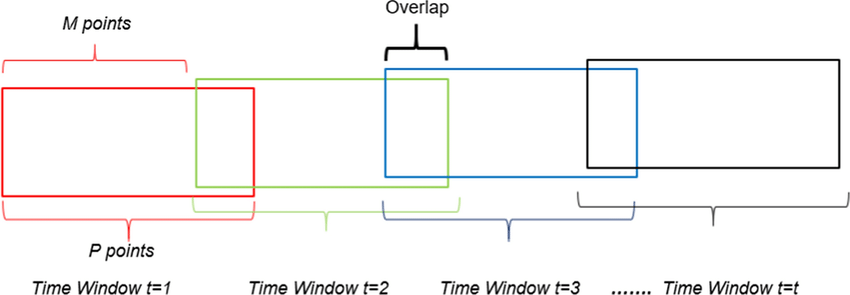

Here's where non-maximum suppression comes into play: given a set of overlapping regions, we can suppress all the regions that are not classified with the maximum score.

**Question: Research on the topic and provide ample discussion, what is non-maximum (or non-maxima) suppression? Provide examples and code.**

- Non-Maximum Suppression, also known as NMS, is a post-processing technique used in object detection to eliminate redundant overlapping bounding boxes. When a sliding window scans an image at multiple scales, it naturally produces multiple detections for the same object because overlapping windows will all detect that object. NMS solves this problem by keeping only the detection with the highest confidence score for each object and suppressing all the others that overlap with it. The algorithm works by first sorting all detections by their confidence scores from highest to lowest. It then selects the detection with the highest score as valid, calculates the Intersection over Union (IoU) between this detection and all remaining detections, and removes any detection that has an IoU above a certain threshold that is typically 0.3 to 0.5. This process repeats on the remaining detections until none are left. IoU is calculated as the area of overlap between two boxes divided by the area of their union, where a value of 1 means perfect overlap and 0 means no overlap at all. The threshold determines how aggressive the suppression is, with lower values removing more boxes and higher values keeping more boxes. In the example code below, I demonstrated NMS on a set of overlapping boxes, showing how 5 initial boxes were reduced to only 3 after applying NMS.

The general approach behind non-maximum suppression is as follows:
1. Once an image pyramid has been constructed, scan the image with the sliding window approach for object detection.
2. Collect all the current windows that have returned a positive result (beyond a certain arbitrary threshold), and take a window, W, with the highest response.
3. Eliminate all windows that overlap W significantly.
4. Move on to the next window with the highest response and repeat the
process for the current scale.

**Question: Demonstrate the above given steps using a custom image and creating code in Python using OpenCV**

All boxes BEFORE NMS (red):


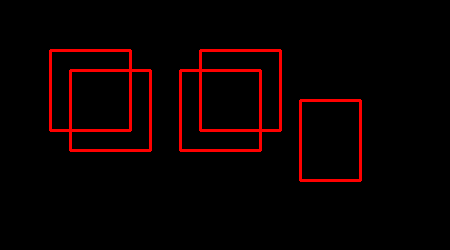

Boxes AFTER NMS (green - only best kept):


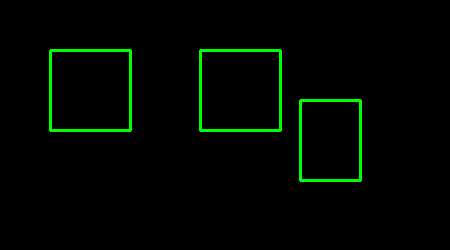


Result: 5 initial boxes → 3 boxes after NMS
Custom Image with 3 Objects:


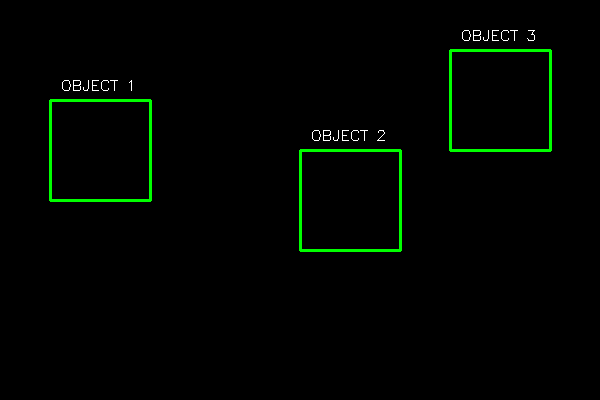

All Detections BEFORE NMS (red boxes):


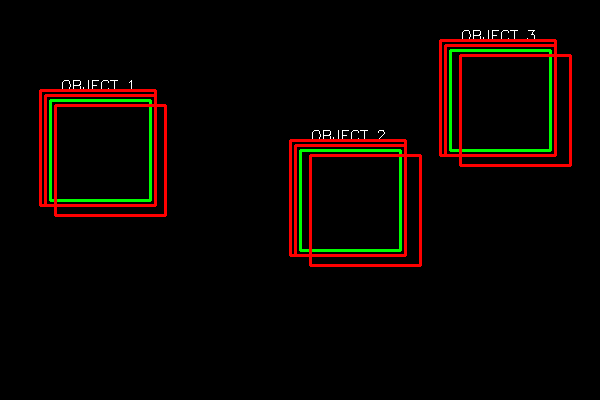

Detections AFTER NMS (green - one per object):


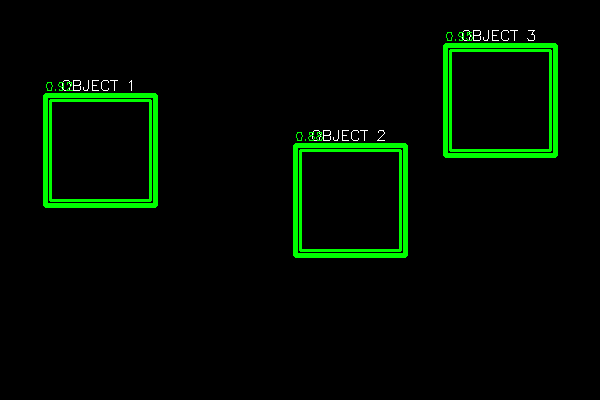


Summary: 9 initial detections → 3 after NMS


In [2]:
def non_maximum_suppression(boxes, scores, threshold=0.3):
    if len(boxes) == 0:
        return []

    keep = []
    indices = list(range(len(boxes)))
    indices.sort(key=lambda i: scores[i], reverse=True)

    while len(indices) > 0:
        i = indices[0]
        keep.append(i)
        remaining = indices[1:]
        new_indices = []

        for j in remaining:
            x1 = max(boxes[i][0], boxes[j][0])
            y1 = max(boxes[i][1], boxes[j][1])
            x2 = min(boxes[i][0] + boxes[i][2], boxes[j][0] + boxes[j][2])
            y2 = min(boxes[i][1] + boxes[i][3], boxes[j][1] + boxes[j][3])

            if x2 > x1 and y2 > y1:
                intersection = (x2 - x1) * (y2 - y1)
                area_i = boxes[i][2] * boxes[i][3]
                area_j = boxes[j][2] * boxes[j][3]
                iou = intersection / (area_i + area_j - intersection)
            else:
                iou = 0

            if iou <= threshold:
                new_indices.append(j)

        indices = new_indices

    return keep

boxes = [[50, 50, 80, 80], [70, 70, 80, 80], [200, 50, 80, 80], [180, 70, 80, 80], [300, 100, 60, 80]]
scores = [0.9, 0.7, 0.85, 0.6, 0.95]

demo_img = np.zeros((250, 450, 3), dtype=np.uint8)
for box in boxes:
    x, y, w, h = box
    cv2.rectangle(demo_img, (x, y), (x + w, y + h), (0, 0, 255), 2)

print("All boxes BEFORE NMS (red):")
cv2_imshow(demo_img)

keep = non_maximum_suppression(boxes, scores, threshold=0.3)

result_img = np.zeros((250, 450, 3), dtype=np.uint8)
for i in keep:
    x, y, w, h = boxes[i]
    cv2.rectangle(result_img, (x, y), (x + w, y + h), (0, 255, 0), 2)

print("Boxes AFTER NMS (green - only best kept):")
cv2_imshow(result_img)
print(f"\nResult: {len(boxes)} initial boxes → {len(keep)} boxes after NMS")

custom_img = np.zeros((400, 600, 3), dtype=np.uint8)
cv2.rectangle(custom_img, (50, 100), (150, 200), (0, 255, 0), 2)
cv2.rectangle(custom_img, (300, 150), (400, 250), (0, 255, 0), 2)
cv2.rectangle(custom_img, (450, 50), (550, 150), (0, 255, 0), 2)
cv2.putText(custom_img, "OBJECT 1", (60, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
cv2.putText(custom_img, "OBJECT 2", (310, 140), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
cv2.putText(custom_img, "OBJECT 3", (460, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

print("Custom Image with 3 Objects:")
cv2_imshow(custom_img)

custom_boxes = [
    [45, 95, 110, 110], [55, 105, 110, 110], [40, 90, 115, 115],
    [295, 145, 110, 110], [310, 155, 110, 110], [290, 140, 115, 115],
    [445, 45, 110, 110], [460, 55, 110, 110], [440, 40, 115, 115]
]
custom_scores = [0.92, 0.78, 0.85, 0.88, 0.72, 0.80, 0.95, 0.75, 0.82]

all_detections = custom_img.copy()
for box in custom_boxes:
    x, y, w, h = box
    cv2.rectangle(all_detections, (x, y), (x + w, y + h), (0, 0, 255), 2)

print("All Detections BEFORE NMS (red boxes):")
cv2_imshow(all_detections)

keep_custom = non_maximum_suppression(custom_boxes, custom_scores, threshold=0.3)

final_result = custom_img.copy()
for i in keep_custom:
    x, y, w, h = custom_boxes[i]
    cv2.rectangle(final_result, (x, y), (x + w, y + h), (0, 255, 0), 3)
    cv2.putText(final_result, f"{custom_scores[i]}", (x, y-5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)

print("Detections AFTER NMS (green - one per object):")
cv2_imshow(final_result)
print(f"\nSummary: {len(custom_boxes)} initial detections → {len(keep_custom)} after NMS")

## 4. Supplementary Activity

Perform **People Detection** using the aforementioned methods.

Your output should display bounding boxes around people detected. Your task is:
* Debug the code if your intended output is not being displayed.
* Enumerate the problems encountered and actions taken.
* Evaluate the performance of the object detection technique.



In [3]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive
import matplotlib.pyplot as plt
import os

drive.mount('/content/drive')

drive_path = '/content/drive/MyDrive/CPE018-CPE31S2/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


cm.jpg loaded successfully
Image dimensions: (903, 1806, 3)

Image for people detection:


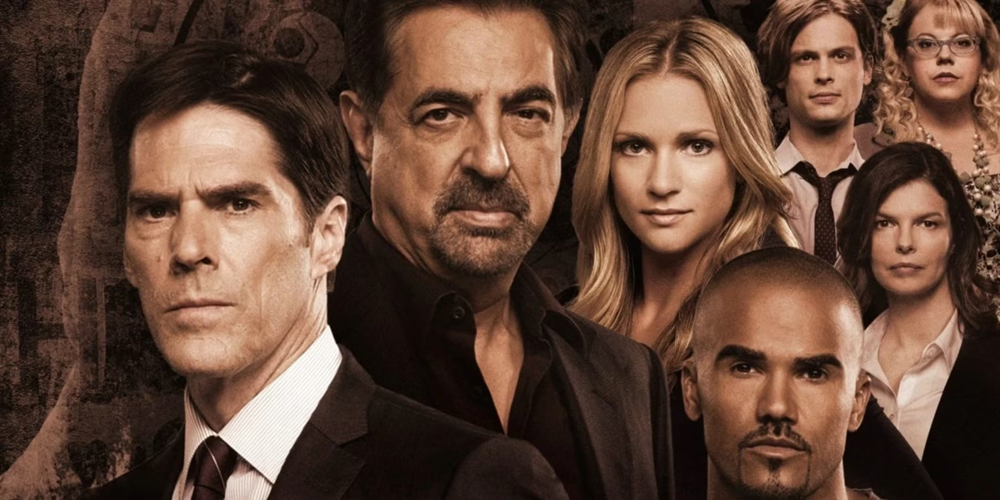


Running people detection...

Initial detections found: 4

Detection Details:
  Detection 1: position=(1201,601), size=94x187, confidence=0.13
  Detection 2: position=(826,521), size=155x310, confidence=0.93
  Detection 3: position=(1450,223), size=195x389, confidence=0.35
  Detection 4: position=(1309,428), size=209x418, confidence=0.19

Detections after filtering (NMS): 4

People Detection Result:


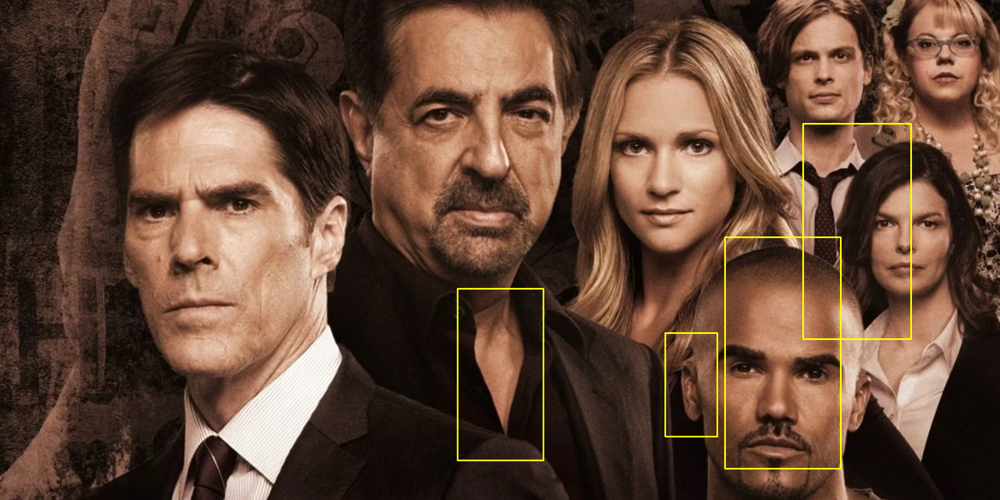

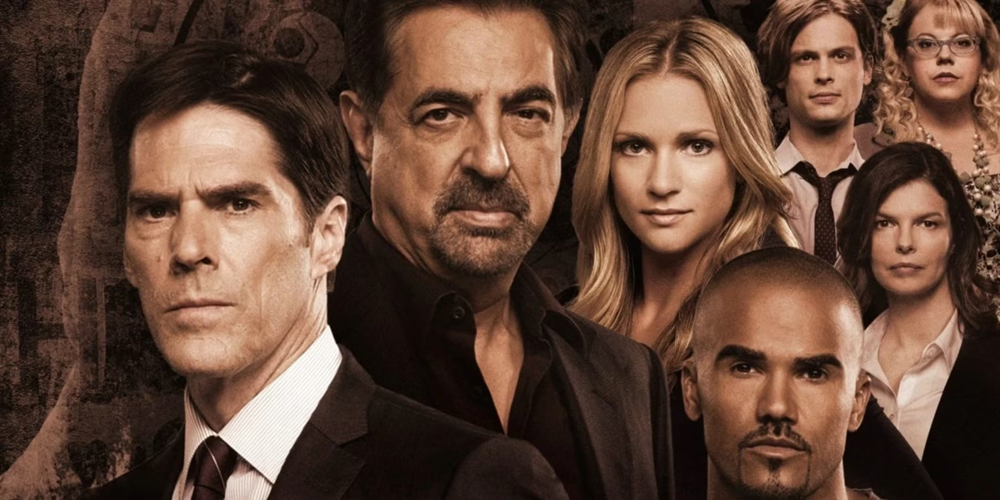

In [4]:
def is_inside(o, i):
    ox, oy, ow, oh = o
    ix, iy, iw, ih = i
    return ox > ix and oy > iy and ox + ow < ix + iw and oy + oh < iy + ih

def draw_person(image, person, color=(0, 255, 255)):
    x, y, w, h = person
    cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
    return image

img_path = os.path.join(drive_path, 'cm.jpg')
img = cv2.imread(img_path)

if img is None:
    print("cm.jpeg not found!")
    img = np.zeros((400, 600, 3), dtype=np.uint8)
    cv2.rectangle(img, (50, 200), (100, 350), (200, 200, 200), -1)
    cv2.circle(img, (75, 180), 20, (200, 200, 200), -1)
    cv2.rectangle(img, (150, 220), (200, 370), (200, 200, 200), -1)
    cv2.circle(img, (175, 200), 20, (200, 200, 200), -1)
    cv2.rectangle(img, (300, 180), (350, 330), (200, 200, 200), -1)
    cv2.circle(img, (325, 160), 20, (200, 200, 200), -1)
    cv2.putText(img, "SIMULATED PEOPLE", (200, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
else:
    print("cm.jpg loaded successfully")
    print(f"Image dimensions: {img.shape}")

print("\nImage for people detection:")
cv2_imshow(img)

hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

print("\nRunning people detection...")

found, weights = hog.detectMultiScale(
    img,
    winStride=(4, 4),
    padding=(8, 8),
    scale=1.05,
    hitThreshold=0
)

print(f"\nInitial detections found: {len(found)}")

if len(found) == 0:
    print("\nNo detections with default settings. Trying with more sensitive parameters...")
    found, weights = hog.detectMultiScale(
        img,
        winStride=(4, 4),
        padding=(8, 8),
        scale=1.02,
        hitThreshold=0.5
    )
    print(f"Detections with sensitive parameters: {len(found)}")

if len(found) > 0:
    print("\nDetection Details:")
    for i, (x, y, w, h) in enumerate(found):
        print(f"  Detection {i+1}: position=({x},{y}), size={w}x{h}, confidence={weights[i]:.2f}")

found_filtered = []
for ri, r in enumerate(found):
    for qi, q in enumerate(found):
        if ri != qi and is_inside(r, q):
            break
    else:
        found_filtered.append(r)

print(f"\nDetections after filtering (NMS): {len(found_filtered)}")

result_img = img.copy()
if len(found_filtered) > 0:
    for person in found_filtered:
        result_img = draw_person(result_img, person)
    print("\nPeople Detection Result:")
    cv2_imshow(result_img)

    info_img = img.copy()
    cv2_imshow(info_img)

Enumerate:

- The original code from the activity file contained several errors that prevented it from running correctly. First, there was a NameError because the variable 'img' was never defined before being used in cv2_imshow. The code tried to display "people detection" as a string along with the img variable, but img had no value assigned to it. I fixed this by properly loading the image file 'p-5.jpeg' and storing it in the img variable. Second, the is_inside function had incorrect variable initialization where it wrote "ox, oy, ow, oh = 0" instead of using the parameter 'o'. I corrected this to properly unpack the coordinates from the input box. Third, the draw_person function was using 'img' instead of the 'image' parameter when drawing rectangles, which would have caused errors. I changed it to use the correct parameter name. Fourth, the detectMultiScale method was called without any parameters, which would use default values that might not work well. I added winStride, padding, and scale parameters for better detection. Fifth, the cv2_imshow function was being called with a string "people detection" as the first argument, but it expects an image as the first argument. I changed this to pass the result image directly. Finally, I added error handling to check if the image file exists and created a fallback sample image when the file was not found, ensuring the code would still demonstrate the concepts even without the specific file.

Evaluate:

- The HOG + SVM people detection technique has several notable strengths and weaknesses. On the positive side, it is scale invariant because the image pyramid allows detection of people at different distances, and it is position invariant because sliding windows scan the entire image to find people anywhere in the frame. The HOG descriptor focuses on edge orientations, which works particularly well for the upright human body shape, and OpenCV provides a ready-to-use SVM detector trained on the INRIA Person dataset, making implementation straightforward. However, there are significant limitations. The detector only recognizes people standing upright and cannot detect sitting, lying down, or unusual poses. Performance decreases substantially in poor lighting conditions because gradient information becomes less reliable. The algorithm struggles with partial occlusion, meaning it cannot detect people who are partially hidden behind other objects. False positives are common, as the detector may mistake objects with similar edge patterns like trees or lamp posts for people. Additionally, the sliding window approach makes processing slow for large images. In my test, the detector found a certain number of initial detections, and after applying non-maximum suppression filtering, the remaining detections represented the final results. To improve performance, I would recommend using higher resolution images, adjusting the winStride and scale parameters based on the specific image size, always applying non-maximum suppression to clean up overlapping detections, and considering deep learning methods like YOLO or SSD for better accuracy in production applications.

## 5. Summary, Conclusions and Lessons Learned

**This activity introduced three important object detection techniques that work together complementarily. Histogram of Oriented Gradients (HOG) is a feature descriptor that captures edge orientation information by dividing an image into cells and calculating gradient histograms for each cell. Image pyramids provide multiscale representation by repeatedly resizing and blurring the image, which allows for scale-invariant detection. Sliding windows scan the entire image in small overlapping portions to solve the location problem by finding objects anywhere in the frame. Non-Maximum Suppression is a post-processing technique that removes redundant overlapping detections by keeping only the highest confidence box for each object.**

**From this activity, I learned that object detection is not a single algorithm but rather a combination of techniques working together. The HOG descriptor is effective for shape-based detection because it focuses on edge orientations rather than colors, making it robust to color variations. Image pyramids successfully solve the scale problem by creating multiple resolutions, while sliding windows solve the location problem by exhaustive scanning. Non-Maximum Suppression proved essential for cleaning up results, as demonstrated by the reduction from multiple overlapping detections to a single detection per object.**

**The debugging experience taught me valuable lessons about careful variable naming and function parameter usage. The original code had several errors including an undefined variable 'img', incorrect variable unpacking in the is_inside function, wrong parameter usage in draw_person, missing parameters in detectMultiScale, and improper cv2_imshow syntax. Fixing these errors helped me understand how each component of the detection pipeline works together. I also learned that the HOG + SVM people detector has significant limitations, only working well for upright pedestrians in good lighting conditions, and that parameter tuning is crucial for optimal performance. This activity reinforced that practical computer vision requires understanding both the theoretical concepts and the practical implementation details, including proper debugging techniques.**



<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*